In [10]:
import subprocess
import shlex

REMOTE_USER = "setemadi3"
REMOTE_HOST = "login-phoenix.pace.gatech.edu"
dirnaeme = "Duffing_hardening_10896438"
REMOTE_DIR = (
f"/storage/home/hcoda1/4/setemadi3/scratch/Modeling/tasks/Basic_FE_sweeps/sim_dat/{dirnaeme}/"
)

DEST_WSL = (
    "/mnt/e/GaTech Dropbox/Seyednima Etemadi/"
	"Projects/Metamaterial beam/"
	f"Modeling/tasks/FE_studies/sim_dat/{dirnaeme}"
)

FILENAME = "config.json"

cmd = (
	f"mkdir -p {shlex.quote(DEST_WSL)} && "
	f"rsync -r --progress "
	f"--no-times --no-perms "
	f"--include='*/' "
	f"--include='{FILENAME}' "
	f"--exclude='*' "
	f"{REMOTE_USER}@{REMOTE_HOST}:{REMOTE_DIR} "
	f"{shlex.quote(DEST_WSL)}"
)

print(cmd)
subprocess.run(["wsl", "bash", "-lc", cmd])

mkdir -p '/mnt/e/GaTech Dropbox/Seyednima Etemadi/Projects/Metamaterial beam/Modeling/tasks/FE_studies/sim_dat/Duffing_hardening_10896438' && rsync -r --progress --no-times --no-perms --include='*/' --include='config.json' --exclude='*' setemadi3@login-phoenix.pace.gatech.edu:/storage/home/hcoda1/4/setemadi3/scratch/Modeling/tasks/Basic_FE_sweeps/sim_dat/Duffing_hardening_10896438/ '/mnt/e/GaTech Dropbox/Seyednima Etemadi/Projects/Metamaterial beam/Modeling/tasks/FE_studies/sim_dat/Duffing_hardening_10896438'


CompletedProcess(args=['wsl', 'bash', '-lc', "mkdir -p '/mnt/e/GaTech Dropbox/Seyednima Etemadi/Projects/Metamaterial beam/Modeling/tasks/FE_studies/sim_dat/Duffing_hardening_10896438' && rsync -r --progress --no-times --no-perms --include='*/' --include='config.json' --exclude='*' setemadi3@login-phoenix.pace.gatech.edu:/storage/home/hcoda1/4/setemadi3/scratch/Modeling/tasks/Basic_FE_sweeps/sim_dat/Duffing_hardening_10896438/ '/mnt/e/GaTech Dropbox/Seyednima Etemadi/Projects/Metamaterial beam/Modeling/tasks/FE_studies/sim_dat/Duffing_hardening_10896438'"], returncode=0)

In [2]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from pathlib import Path

# =========================================================
# USER: LOAD RUN
# =========================================================
# run_dir = Path("sim_dat/Altern_Ki_1")   # <-- change if needed
# run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\topological\sim_dat\downSweep2")
run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\downSweep2")
# run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\3_1_internalResonance")
run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\Duffing")
run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\softening\sweep_1")
run_dir = Path(fr"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\{dirnaeme}")
# run_dir = Path(r"C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\softening3_3")
pickle_candidates = sorted(run_dir.glob("*.pkl"))
if not pickle_candidates:
    raise FileNotFoundError(f"No .pkl file found in: {run_dir}")

pickle_file = pickle_candidates[-1]
print(f"Loading FE data from:\n  {pickle_file}\n")
pkl_path = pickle_file

with open(pickle_file, "rb") as f:
	pkl = pickle.load(f)

results = pkl["results"]
sweep_keys = pkl["sweep"]["keys"]
sweep_grid = pkl["sweep"].get("grid", [])

print("Sweep keys:", sweep_keys)
print(f"Loaded {len(results)} results")
print(f"Sweep grid entries: {len(sweep_grid)}")
if len(sweep_grid) != len(results):
	print("[Warning] sweep.grid length differs from results length.")
	print("          Grouping/filtering by sweep-only keys uses index mapping where possible.")

print(pkl.keys())
# pkl["meta"]
print("len(pkl['sweep']['grid']):", len(pkl['sweep']['grid']))
print(pkl['sweep'])
print("length of results:", len(pkl["results"]))
print(pkl['failed'])
print(pkl["results"][0].keys())


FileNotFoundError: No .pkl file found in: C:\Users\setemadi3\GaTech Dropbox\Seyednima Etemadi\Projects\Metamaterial beam\Modeling\tasks\FE_studies\sim_dat\Duffing_hardening_10896438

In [3]:
# =========================================================
# PKL STRUCTURE INSPECTOR
# =========================================================
import pickle
import numpy as np
from pathlib import Path

# Load if not already present
if "pkl" not in globals():
	# run_dir = Path("sim_dat/Altern_Ki")   # <-- change if needed
	# pkl_path = run_dir / "results.pkl"
	with open(pkl_path, "rb") as f:
		pkl = pickle.load(f)

def summarize_obj(obj, name="root", indent=0, max_items=5, max_depth=4):
	pad = "  " * indent
	t = type(obj).__name__

	if indent > max_depth:
		print(f"{pad}- {name}: {t} (...)" )
		return

	if isinstance(obj, dict):
		print(f"{pad}- {name}: dict (keys={len(obj)}) -> {list(obj.keys())}")
		for i, (k, v) in enumerate(obj.items()):
			if i >= max_items:
				print(f"{pad}  ... ({len(obj)-max_items} more keys)")
				break
			summarize_obj(v, name=str(k), indent=indent+1, max_items=max_items, max_depth=max_depth)

	elif isinstance(obj, list):
		print(f"{pad}- {name}: list (len={len(obj)})")
		for i, v in enumerate(obj[:max_items]):
			summarize_obj(v, name=f"[{i}]", indent=indent+1, max_items=max_items, max_depth=max_depth)
		if len(obj) > max_items:
			print(f"{pad}  ... ({len(obj)-max_items} more items)")

	elif isinstance(obj, np.ndarray):
		print(f"{pad}- {name}: ndarray shape={obj.shape}, dtype={obj.dtype}")

	elif isinstance(obj, tuple):
		print(f"{pad}- {name}: tuple (len={len(obj)})")
		for i, v in enumerate(obj[:max_items]):
			summarize_obj(v, name=f"({i})", indent=indent+1, max_items=max_items, max_depth=max_depth)
		if len(obj) > max_items:
			print(f"{pad}  ... ({len(obj)-max_items} more items)")

	else:
		preview = repr(obj)
		if len(preview) > 80:
			preview = preview[:77] + "..."
		print(f"{pad}- {name}: {t} = {preview}")

print("=== PKL High-Level Structure ===")
summarize_obj(pkl, name="pkl", max_items=6, max_depth=3)

print("\n=== Useful Quick Summary ===")
print("top-level keys:", list(pkl.keys()))
print("results count:", len(pkl.get("results", [])))
print("failed count:", len(pkl.get("failed", [])))
print("sweep keys:", pkl.get("sweep", {}).get("keys", []))
print("sweep grid length:", len(pkl.get("sweep", {}).get("grid", [])))

if len(pkl.get("results", [])) > 0:
	r0 = pkl["results"][0]
	print("\nfirst result keys:", list(r0.keys()))
	print("first result params keys:", list(r0.get("params", {}).keys()))
	if "sweep_entry" in r0:
		print("first result sweep_entry keys:", list(r0["sweep_entry"].keys()))
	if "data" in r0:
		data_keys = list(r0["data"].keys())
		print("first result data keys:", data_keys)
		for k in data_keys:
			v = r0["data"][k]
			if isinstance(v, np.ndarray):
				print(f"  data['{k}']: shape={v.shape}, dtype={v.dtype}")
			else:
				print(f"  data['{k}']: type={type(v).__name__}")

=== PKL High-Level Structure ===
- pkl: dict (keys=4) -> ['meta', 'sweep', 'results', 'failed']
  - meta: dict (keys=4) -> ['run_dir', 'created_at', 'status_files_found', 'expected_total']
    - run_dir: str = '/storage/scratch1/4/setemadi3/Modeling/tasks/FE_studies/sim_dat/NES_4976705'
    - created_at: str = '2026-03-17T17:43:11.302742'
    - status_files_found: int = 96
    - expected_total: int = 96
  - sweep: dict (keys=2) -> ['keys', 'grid']
    - keys: list (len=3)
      - [0]: str = 'amp'
      - [1]: str = 'K_c'
      - [2]: str = 'K_p'
    - grid: list (len=96)
      - [0]: dict (keys=3) -> ['amp', 'K_c', 'K_p']
        - amp: str (...)
        - K_c: str (...)
        - K_p: str (...)
      - [1]: dict (keys=3) -> ['amp', 'K_c', 'K_p']
        - amp: str (...)
        - K_c: str (...)
        - K_p: str (...)
      - [2]: dict (keys=3) -> ['amp', 'K_c', 'K_p']
        - amp: str (...)
        - K_c: str (...)
        - K_p: str (...)
      - [3]: dict (keys=3) -> ['amp', 'K_

In [4]:
pkl['results'][0]['params']['amp']

25.0

In [5]:
def compute_frf_from_time_domain(t, veloc, amp, f0=500, f1=3000):
	"""
	Compute Frequency Response Function (FRF) from time domain response.
	
	Performs FFT on velocity field and excitation signal, then computes
	the spatially-averaged transfer function.
	
	Parameters
	----------
	t : array_like
		Time vector [s]
	veloc : ndarray
		Velocity field array of shape (n_time, n_spatial) where:
		- n_spatial: number of spatial points
		- n_time: number of time samples
	v_exc_values : array_like
		Excitation voltage/velocity values at each time point,
		shape (n_time,)
	
	Returns
	-------
	result : dict
		Dictionary containing:
		- 'freq': frequency array [Hz]
		- 'FRF': frequency response function (spatially averaged magnitude)
		- 'Y': FFT of velocity field, shape (n_freq, n_spatial)
		- 'X': FFT of excitation signal, shape (n_freq,)
	
	Notes
	-----
	- Only positive frequencies are returned
	- FRF is computed as: mean(|Y|) / |X| over spatial dimension
	- If time vector has < 2 samples, returns None values
	"""
	t_end = t[-1] - t[0]
	def v_exc(t):
			return amp * np.sin(
				2 * np.pi * (f0 + t * (f1 - f0) / t_end) * t
			)
	t = np.asarray(t)
	veloc = np.asarray(veloc)
	v_exc_values = np.asarray(v_exc(t))
	
	Nt = len(t)
	
	if Nt < 2:
		return {
			'freq': None,
			'FRF': None,
			'Y': None,
			'X': None
		}
	
	dt = t[1] - t[0]
	
	# FFT of velocity field (spatial x temporal)
	Y = np.fft.fft(veloc, axis=0)
	
	# FFT of excitation signal
	X = np.fft.fft(v_exc_values)
	
	# Frequency vector [Hz]
	freq = np.fft.fftfreq(Nt, d=dt)
	
	# Keep only positive frequencies
	print("X shape:", X.shape, "Y shape:", Y.shape, "freq shape:", freq.shape, "veloc shape:", veloc.shape)
	idx = freq >= 0
	freq = freq[idx]
	Y = Y[idx, :]
	X = X[ idx]
	
	# FRF: spatially averaged magnitude of transfer function
	# Avoid division by zero
	X_mag = np.abs(X)
	X_mag = np.where(X_mag < 1e-10, 1.0, X_mag)  # Replace near-zero with 1 to avoid division by zero
	
	FRF = np.mean(np.abs(Y), axis=1) / X_mag
	
	return {
		'freq': freq,
		'FRF': FRF,
		'Y': Y,
		'X': X
	}

In [6]:
r

NameError: name 'r' is not defined

Plotting 48 curves
Grouped by 'K_c' -> 4 groups
Creating 4 separate figures (one per group)
Color code inside each figure: 'K_p'
COLOR_BY range active: (0.004, 0.14) (drop)

=== Group: K_c = 600000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (

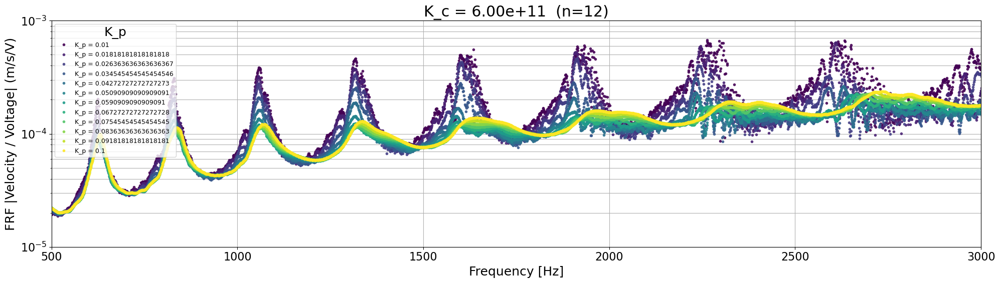


=== Group: K_c = 1400000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

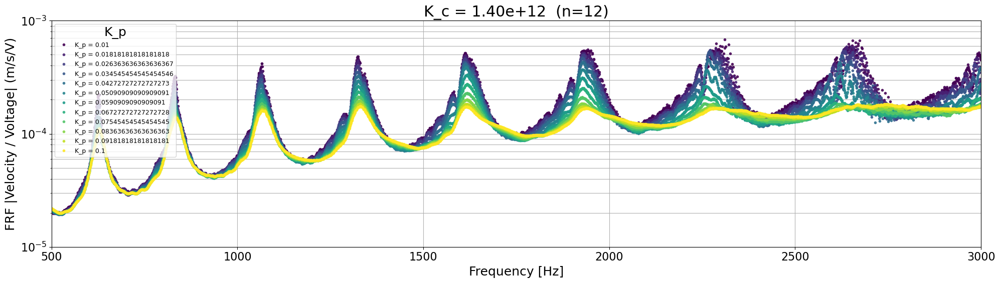


=== Group: K_c = 2200000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

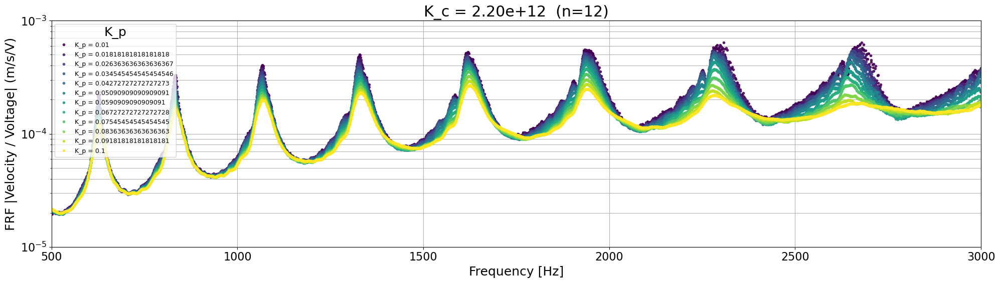


=== Group: K_c = 3000000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

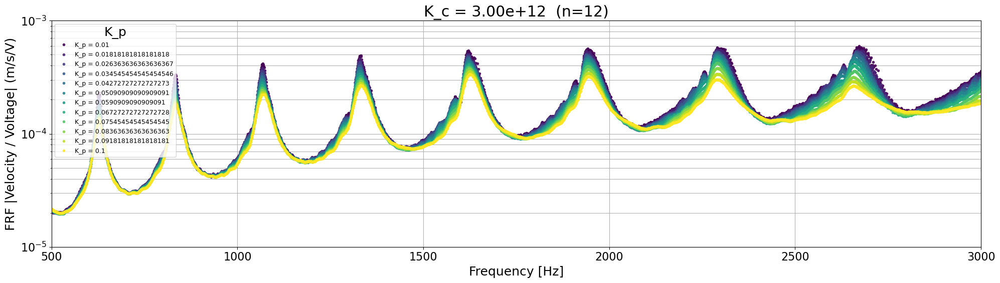

In [ ]:
# =========================================================
# HELPER: metadata / key handling
# =========================================================
def make_hashable(value):
	if isinstance(value, np.ndarray):
		return tuple(np.asarray(value).tolist())
	if isinstance(value, list):
		return tuple(value)
	return value

def get_record_value(record, key, sweep_grid):
	idx = record["idx"]
	result = record["result"]

	params = result.get("params", {})
	if key in params:
		return params[key]

	sweep_entry = result.get("sweep_entry", {})
	if isinstance(sweep_entry, dict) and key in sweep_entry:
		return sweep_entry[key]

	if idx < len(sweep_grid):
		entry = sweep_grid[idx]
		if isinstance(entry, dict) and key in entry:
			return entry[key]

	raise KeyError(key)

def available_param_keys(records, sweep_grid):
	keys = set()
	for record in records:
		result = record["result"]
		params = result.get("params", {})
		keys.update(params.keys())

		sweep_entry = result.get("sweep_entry", {})
		if isinstance(sweep_entry, dict):
			keys.update(sweep_entry.keys())

		idx = record["idx"]
		if idx < len(sweep_grid) and isinstance(sweep_grid[idx], dict):
			keys.update(sweep_grid[idx].keys())

	return sorted(keys)

def is_numeric_scalar(x):
	return isinstance(x, (int, float, np.integer, np.floating))

def apply_color_range(value, value_range, mode="drop"):
	"""
Returns (keep_curve, mapped_value).
- drop: curve is removed if outside range
- clip: curve stays and color value is clipped to range
"""
	if value_range is None:
		return True, value
	if not is_numeric_scalar(value):
		return True, value

	vmin, vmax = value_range
	if vmin > vmax:
		vmin, vmax = vmax, vmin

	if mode == "drop":
		if value < vmin or value > vmax:
			return False, value
		return True, value

	# clip mode (default fallback if mode is unexpected)
	return True, min(max(value, vmin), vmax)

# =========================================================
# HELPER: filter results by fixed parameters
# =========================================================
def filter_records(records, fixed_params, sweep_grid):
	"""
	fixed_params: dict of {param_name: value}
	Returns list of matching records
	(each record has idx + result)
	"""
	out = []
	for record in records:
		ok = True
		for k, v in fixed_params.items():
			try:
				pv = get_record_value(record, k, sweep_grid)
			except KeyError:
				ok = False
				break

			if isinstance(pv, np.ndarray) or isinstance(v, np.ndarray):
				if not np.array_equal(np.asarray(pv), np.asarray(v)):
					ok = False
					break
			elif pv != v:
				ok = False
				break

		if ok:
			out.append(record)
	return out

# =========================================================
# HELPER: group records by a parameter
# =========================================================
def group_by(records, key, sweep_grid):
	groups = defaultdict(list)
	for record in records:
		try:
			value = get_record_value(record, key, sweep_grid)
		except KeyError:
			continue
		groups[make_hashable(value)].append(record)
	return groups

# =========================================================
# USER: WHAT TO PLOT
# =========================================================
#
# Choose:
#   - x-axis: always frequency
#   - y-data: FRF
#   - group curves by ONE parameter
#   - optionally fix other parameters
#
GROUP_BY = "K_c"          # e.g. "amp", "beta", "K_c", "K_p"
COLOR_BY = "K_p"           # legend/color code inside each figure; set None for default colors
FIX_PARAMS = {
	# "K_c": 2e10,         # uncomment to fix K_c
	# "K_p": 0.015,       # uncomment to fix K_p
	# "beta": 0.0,        # works via sweep.grid fallback
	"amp": 50# pkl['results'][0]['params']['amp'],
}

COLOR_BY_RANGE = (0.004, 0.14)
COLOR_BY_RANGE_MODE = "drop"   # "drop" or "clip"

# =========================================================
# FILTER + GROUP
# =========================================================
records = [{"idx": i, "result": r} for i, r in enumerate(results)]
filtered_records = filter_records(records, FIX_PARAMS, sweep_grid)

if len(filtered_records) == 0:
	raise RuntimeError("No results match FIX_PARAMS")

avail_keys = available_param_keys(filtered_records, sweep_grid)
group_key = GROUP_BY
if group_key not in avail_keys:
	fallback = None
	if len(sweep_keys) > 0 and sweep_keys[0] in avail_keys:
		fallback = sweep_keys[0]
	elif len(avail_keys) > 0:
		fallback = avail_keys[0]

	if fallback is None:
		raise RuntimeError("No plottable parameter keys found in filtered results")

	print(f"[Warning] GROUP_BY='{GROUP_BY}' not found. Using '{fallback}' instead.")
	print(f"Available keys: {avail_keys}")
	group_key = fallback

groups = group_by(filtered_records, group_key, sweep_grid)

print(f"Plotting {len(filtered_records)} curves")
print(f"Grouped by '{group_key}' -> {len(groups)} groups")
print(f"Creating {len(groups)} separate figures (one per group)")
if COLOR_BY is not None:
	print(f"Color code inside each figure: '{COLOR_BY}'")
	if COLOR_BY_RANGE is not None:
		print(f"COLOR_BY range active: {COLOR_BY_RANGE} ({COLOR_BY_RANGE_MODE})")

# =========================================================
# PLOT (one figure per group)
# =========================================================
for val, group_records in sorted(groups.items()):
	print(f"\n=== Group: {group_key} = {val} (n={len(group_records)}) ===")
	plt.figure(figsize=(20, 6))

	# Precompute which curves stay and what color-value they map to
	plot_items = []  # (record, mapped_color_value_or_None, label)
	skipped = 0
	seen_color_values = []
	for i, record in enumerate(group_records):
		if COLOR_BY is None:
			plot_items.append((record, None, f"curve {i + 1}"))
			continue
		try:
			cv_raw = get_record_value(record, COLOR_BY, sweep_grid)
		except KeyError:
			plot_items.append((record, None, f"curve {i + 1}"))
			continue
		keep, cv_mapped = apply_color_range(cv_raw, COLOR_BY_RANGE, COLOR_BY_RANGE_MODE)
		if not keep:
			skipped += 1
			continue
		cv_mapped = make_hashable(cv_mapped)
		seen_color_values.append(cv_mapped)
		plot_items.append((record, cv_mapped, f"{COLOR_BY} = {cv_mapped}"))

	if skipped > 0:
		print(f"  [Info] Skipped {skipped} curve(s) outside COLOR_BY range")

	if len(plot_items) == 0:
		plt.close()
		print("  [Info] No curves left to plot in this group")
		continue

	# Build color map only from values that survived range handling
	color_map = {}
	if COLOR_BY is not None and len(seen_color_values) > 0:
		unique_vals = sorted(set(seen_color_values))
		cmap_vals = plt.cm.viridis(np.linspace(0, 1, len(unique_vals)))
		color_map = {k: c for k, c in zip(unique_vals, cmap_vals)}

	for i, (record, cv_mapped, line_label) in enumerate(plot_items):
		r = record["result"]
		spect = compute_frf_from_time_domain(
			t=r["data"]["t"],
			veloc=r["data"]["u_dot"],
			amp=r["params"]["amp"],
		)
		freq = spect['freq']
		FRF = spect['FRF']

		line_color = color_map.get(cv_mapped, None) if COLOR_BY is not None else None
		plt.semilogy(freq, FRF, '.', color=line_color, alpha=0.85, label=line_label, linewidth=2.5)

	# Deduplicate legend labels
	handles, labels = plt.gca().get_legend_handles_labels()
	seen = set()
	uniq_handles, uniq_labels = [], []
	for h, l in zip(handles, labels):
		if l not in seen:
			uniq_handles.append(h)
			uniq_labels.append(l)
			seen.add(l)

	plt.xlabel("Frequency [Hz]")
	plt.ylabel(r"FRF |Velocity / Voltage| (m/s/V)")
	plt.title(f"{group_key} = {float(val):0.2e}  (n={len(group_records)})")
	plt.grid(True, which="both")
	plt.legend(uniq_handles, uniq_labels, title=(COLOR_BY if COLOR_BY else None), fontsize=9)
	plt.tight_layout()
	plt.xlim([500, 3000])
	plt.ylim([1e-5, 1e-3])
	plt.rcParams.update({
	"font.size": 9*2,
	"axes.labelsize": 9*2,
	"xtick.labelsize": 8*2,
	"ytick.labelsize": 8*2,
	"legend.fontsize": 8*2,
	# "title.fontsize": 12,
	})

	plt.show()

# Time-domain plots


=== Group: K_c = 600000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq

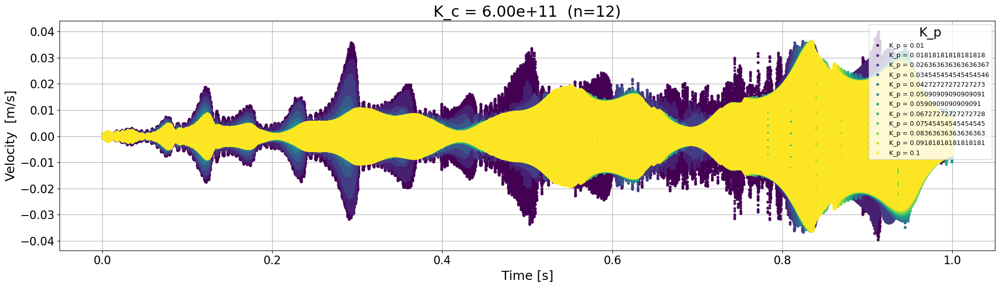


=== Group: K_c = 1400000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

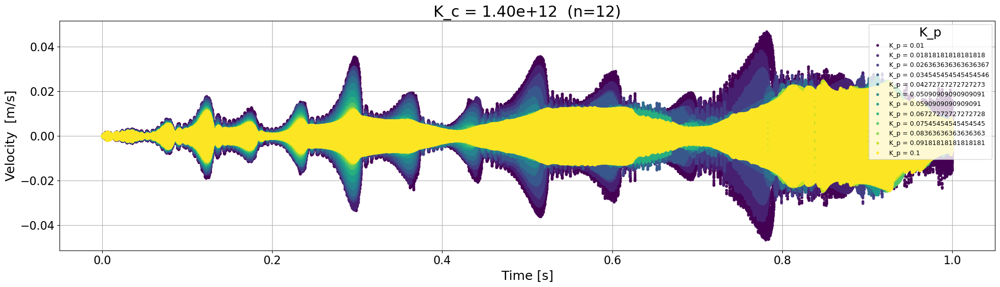


=== Group: K_c = 2200000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

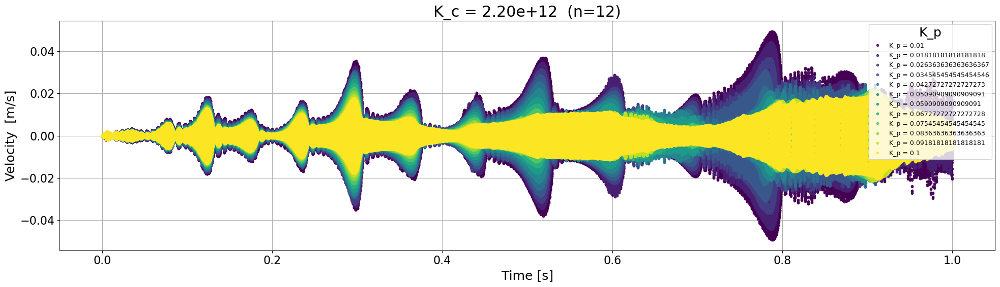


=== Group: K_c = 3000000000000.0 (n=12) ===
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) freq shape: (150001,) veloc shape: (150001, 157)
X shape: (150001,) Y shape: (150001, 157) fre

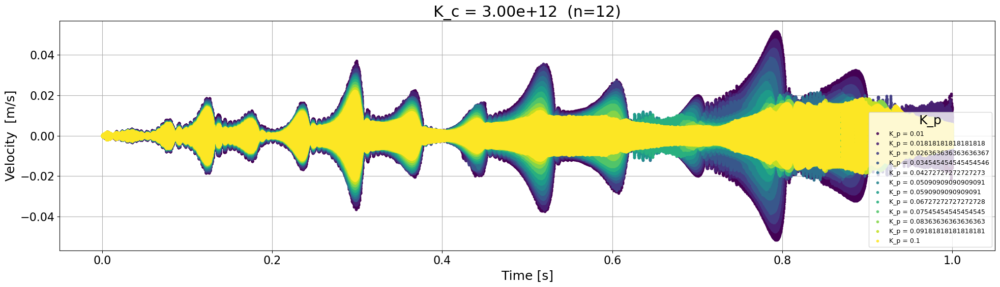

In [ ]:
# PLOT (one figure per group)
# =========================================================
for val, group_records in sorted(groups.items()):
	print(f"\n=== Group: {group_key} = {val} (n={len(group_records)}) ===")
	plt.figure(figsize=(20, 6))

	# Precompute which curves stay and what color-value they map to
	plot_items = []  # (record, mapped_color_value_or_None, label)
	skipped = 0
	seen_color_values = []
	for i, record in enumerate(group_records):
		if COLOR_BY is None:
			plot_items.append((record, None, f"curve {i + 1}"))
			continue
		try:
			cv_raw = get_record_value(record, COLOR_BY, sweep_grid)
		except KeyError:
			plot_items.append((record, None, f"curve {i + 1}"))
			continue
		keep, cv_mapped = apply_color_range(cv_raw, COLOR_BY_RANGE, COLOR_BY_RANGE_MODE)
		if not keep:
			skipped += 1
			continue
		cv_mapped = make_hashable(cv_mapped)
		seen_color_values.append(cv_mapped)
		plot_items.append((record, cv_mapped, f"{COLOR_BY} = {cv_mapped}"))

	if skipped > 0:
		print(f"  [Info] Skipped {skipped} curve(s) outside COLOR_BY range")

	if len(plot_items) == 0:
		plt.close()
		print("  [Info] No curves left to plot in this group")
		continue

	# Build color map only from values that survived range handling
	color_map = {}
	if COLOR_BY is not None and len(seen_color_values) > 0:
		unique_vals = sorted(set(seen_color_values))
		cmap_vals = plt.cm.viridis(np.linspace(0, 1, len(unique_vals)))
		color_map = {k: c for k, c in zip(unique_vals, cmap_vals)}

	for i, (record, cv_mapped, line_label) in enumerate(plot_items):
		r = record["result"]
		spect = compute_frf_from_time_domain(
			t=r["data"]["t"],
			veloc=r["data"]["u_dot"],
			amp=r["params"]["amp"],
		)
		t = r["data"]["t"]
		u_dot = r["data"]["u_dot"][:, 50]

		line_color = color_map.get(cv_mapped, None) if COLOR_BY is not None else None
		plt.plot(t, u_dot, '.', color=line_color, alpha=0.85, label=line_label, linewidth=2.5)

	# Deduplicate legend labels
	handles, labels = plt.gca().get_legend_handles_labels()
	seen = set()
	uniq_handles, uniq_labels = [], []
	for h, l in zip(handles, labels):
		if l not in seen:
			uniq_handles.append(h)
			uniq_labels.append(l)
			seen.add(l)

	plt.xlabel("Time [s]")
	plt.ylabel(r"Velocity  [m/s]")
	plt.title(f"{group_key} = {float(val):0.2e}  (n={len(group_records)})")
	plt.grid(True, which="both")
	plt.legend(uniq_handles, uniq_labels, title=(COLOR_BY if COLOR_BY else None), fontsize=9)
	plt.tight_layout()
	# plt.xlim([500, 3000])
	# plt.ylim([1e-5, 1e-3])
	plt.rcParams.update({
	"font.size": 9*2,
	"axes.labelsize": 9*2,
	"xtick.labelsize": 8*2,
	"ytick.labelsize": 8*2,
	"legend.fontsize": 8*2,
	# "title.fontsize": 12,
	})

	plt.show()

In [ ]:
import numpy as np
from scipy.optimize import fsolve
from scipy.integrate import solve_ivp
import sys
from pathlib import Path
import importlib
# add Modeling/ to Python path
project_root = Path.cwd().parents[2]
sys.path.append(str(project_root))
import Modeling
importlib.reload(Modeling)
from Modeling.models.plotting import animate_field_1d
from Modeling.models.beam_properties import PiezoBeamParams
from Modeling.models import FE_helpers 
importlib.reload(FE_helpers)
import matplotlib.pyplot as plt
# from Modeling.models.ROM import ROM

import Modeling.models.FE3 as FE_module
importlib.reload(FE_module)
FE = FE_module
# import Modeling.models.ROM as ROM_module
# importlib.reload(ROM_module)
# ROM = ROM_module.ROM

# from FE1 import PiezoBeamFE, frf_sweep, solve_newmark
import numpy as np
from numpy import pi	
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from IPython.display import clear_output
from matplotlib import cm, colors
import pandas as pd
from joblib import Parallel, delayed
import matplotlib.pyplot as plt

K_i = 1800; K_i_nl = K_i ; K_p = 0.01; K_c = 0; R_c = 1e3
# K_i = 0; K_p = 100000; K_c = 0; R_c = 1e3
# K_i = 0; K_p = 1e-5; K_c = 0; R_c = 1e3
t_end = 0.01
f0 = 1000
f1 = 5000
dt = 1/f1/20
def v_exc(t, A_exc=50, f0=f0, f1=f1, t_end=t_end):
	return A_exc*np.sin(2*np.pi*(f0+ t*(f1-f0)/t_end) *t)
# N = 40
# hp, hs = 0.31e-3, 0.607e-3 		
params_fe = PiezoBeamParams(
                            hp=0.252e-3, hs=0.51e-3,
                            # hp=0.31e-3, hs=0.607e-3,
                            d31= -1.48e-10,eps_r=1700,
							# rho_p=8000,
							# omega_p=2*pi*100, omega_q=2*pi*1000
                            )
params_fe.zeta_p = 0.0151*8
params_fe.zeta_q = 0.0392*10
# params_fe.zeta_p = 0.15
# params_fe.zeta_q = 0.1
# params_fe.plot_zeta_vs_omega()
def print_derived_params(params_fe):
	print("=== Derived / Calibrated Parameters ===")

	print(f"S (number of patches)        = {params_fe.S}")
	print(f"L_b (beam length) [m]        = {params_fe.L_b:.6f}")

	print("\n--- Electromechanical ---")
	print(f"e31 (effective) [C/m^2]      = {params_fe.e31:.4e}")
	print(f"theta_mech (vartheta) [SI]   = {params_fe.theta_mech:.4e}")
	print(f"Cp (per patch) [F]           = {params_fe.Cp_scalar:.4e}")

	print("\n--- Mechanical ---")
	print(f"m (mass/length) [kg/m]       = {params_fe.m:.4f}")
	print(f"m substrate (mass/length) [kg/m]       = {params_fe.rho_s * params_fe.hs * params_fe.b:.4f}")
	print(f"YI (bending stiffness) [NmÂ²] = {params_fe.YI:.4e}")

	print("\n--- Damping (Rayleigh) ---")
	print(f"omega_p [Hz]                 = {params_fe.omega_p/(2*np.pi):.2f}")
	print(f"omega_q [Hz]                 = {params_fe.omega_q/(2*np.pi):.2f}")
	print(f"zeta_p [-]                   = {params_fe.zeta_p:.4f}")
	print(f"zeta_q [-]                   = {params_fe.zeta_q:.4f}")
	print(f"c_alpha [SI]                 = {params_fe.c_alpha:.4e}")
	print(f"c_beta  [SI]                 = {params_fe.c_beta:.4e}")
	

# print_derived_params(params_fe)

# ============================================================================
# FE SYSTEM SETUP
# ============================================================================

fe = FE.PiezoBeamFE(params_fe
					# , n_el_gap=3, n_el_patch=5
					)
f_target = 3426.0  # Hz
fe = FE_module.PiezoBeamFE(params_fe)

x_coords_fe = fe.geom.x_nodes[1:]
idx = 0
group_records = groups[6e10]
freq_td = group_records[idx]["result"]['data']['freq']
# If FE FRF sweep exists, sample nearest; otherwise compute single-frequency FRF
idx_near = np.argmin(np.abs(freq_td - f_target))
w_hat_nodes = group_records[idx]["result"]['data']['Y'][idx_near, :]  # displacement at reduced nodes (complex)
omega_t = 2*np.pi*freq_td[idx_near]
v_plot = np.abs(w_hat_nodes) * np.where((np.angle(w_hat_nodes)>=-np.pi/2) & (np.angle(w_hat_nodes)<=np.pi/2), 1, -1)
v_plot = np.imag(w_hat_nodes) 
max_abs = np.max(np.abs(v_plot))
if max_abs > 0:
    v_plot = v_plot / max_abs

plt.figure(figsize=(10, 2))
plt.plot(x_coords_fe, v_plot, 'r-', linewidth=2)
# plt.xlabel('Position along beam [m]')
# plt.ylabel('Normalized velocity (real)')
plt.title(f'FE time domain Mode shape at {f_target:.1f} Hz')
plt.grid(True)
plt.tight_layout()
plt.show()
# print("ki0= ", ki0, 'beta= ', beta, 'f_target= ', f_target)

IndexError: list index out of range

In [ ]:
groups.keys()
groups[2e10]
# groups.items()
# type(groups)

[{'idx': 5,
  'result': {'index': 5,
   'sweep_entry': {'amp': 6.25, 'K_c': 20000000000.0},
   'params': {'K_p': 0.03,
    'K_i': array([8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612, 2366.86390533,
           8163.26530612, 2366.86390533, 8163.26530612]),
    'K_c': 20000000000.0,
    'R_c': 1000.0,
    'amp': 6.25},
   'data': {'freq': array([0.000000e+00, 9.999960e-01, 1.999992e+00, ..., 1.249975e+05,
           1.249985e+05, 1.249995e+05], shape=(125001,)),
    'FRF': array([5.51844743e-05, 5.51844427e-05, 5.51843520e-05, ...,
           2.80927701e-03, 2.80927708e-

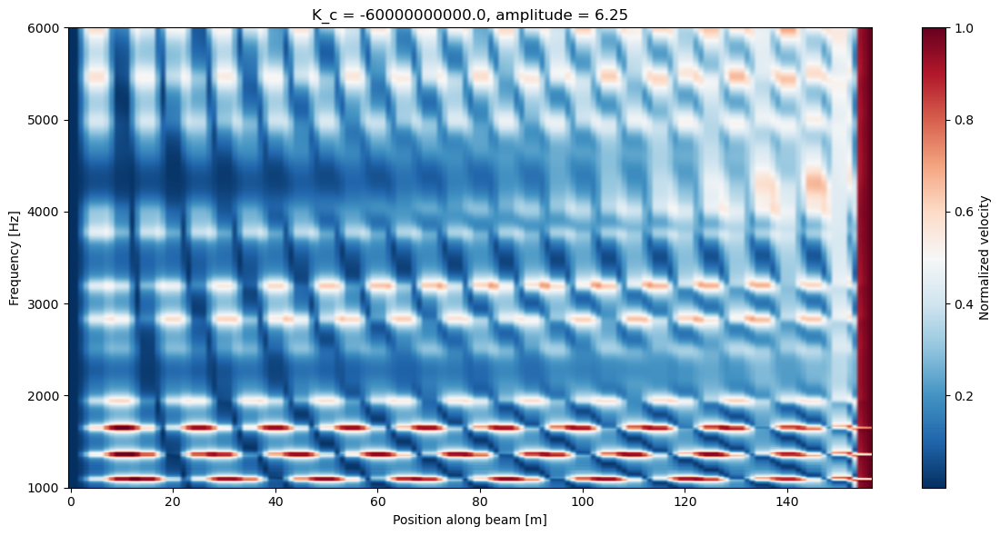

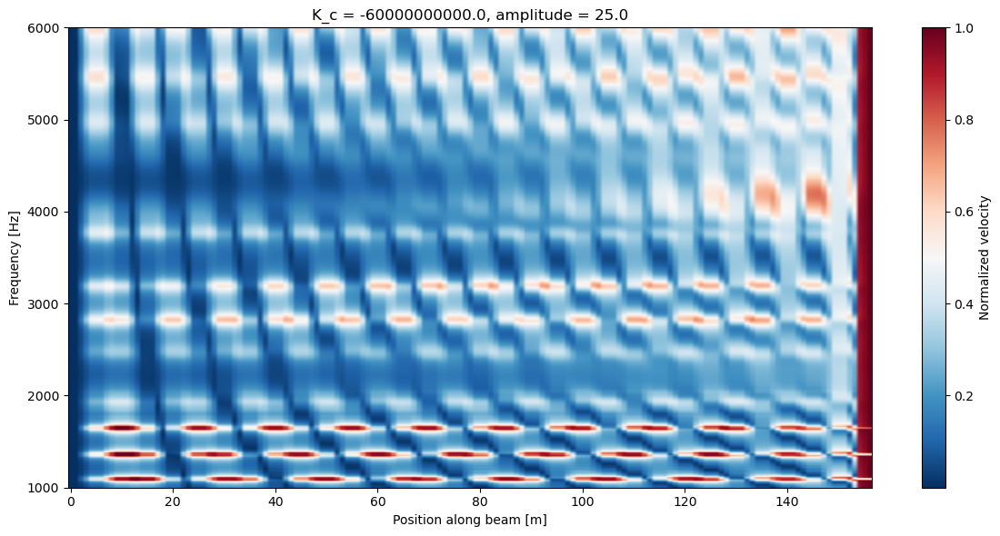

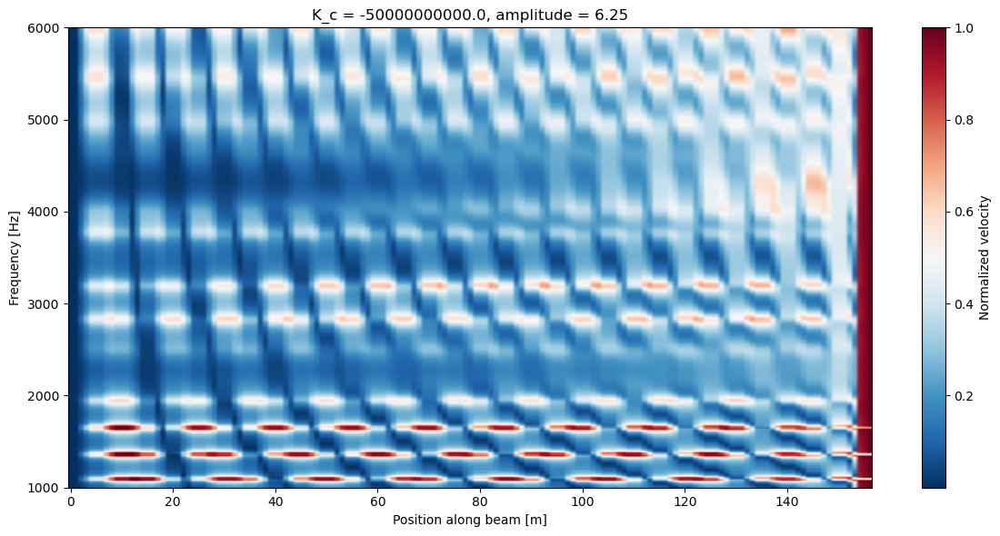

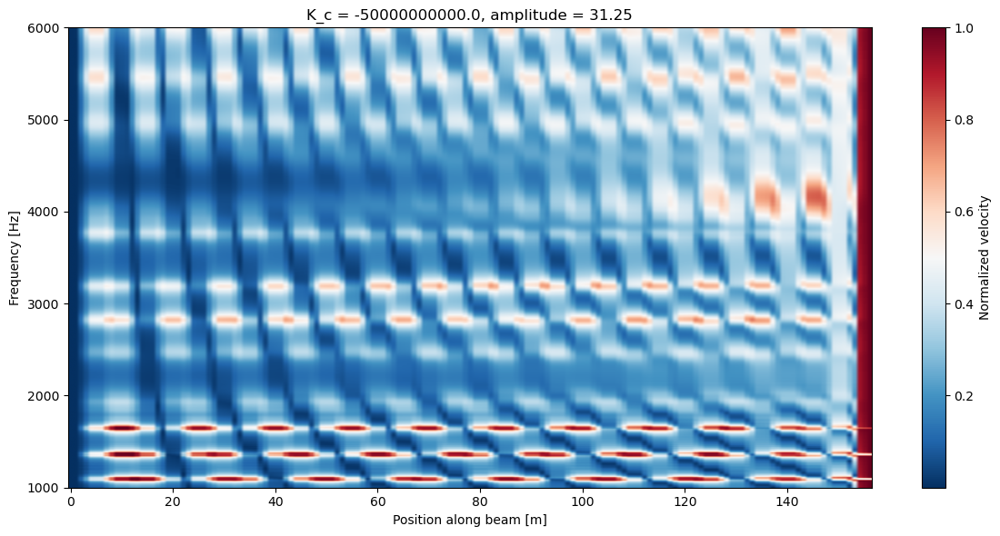

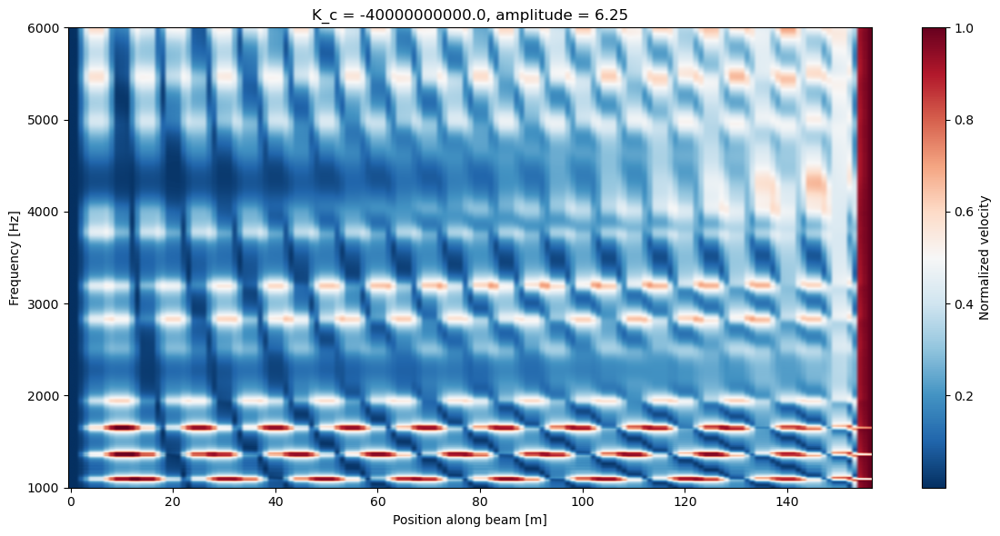

...

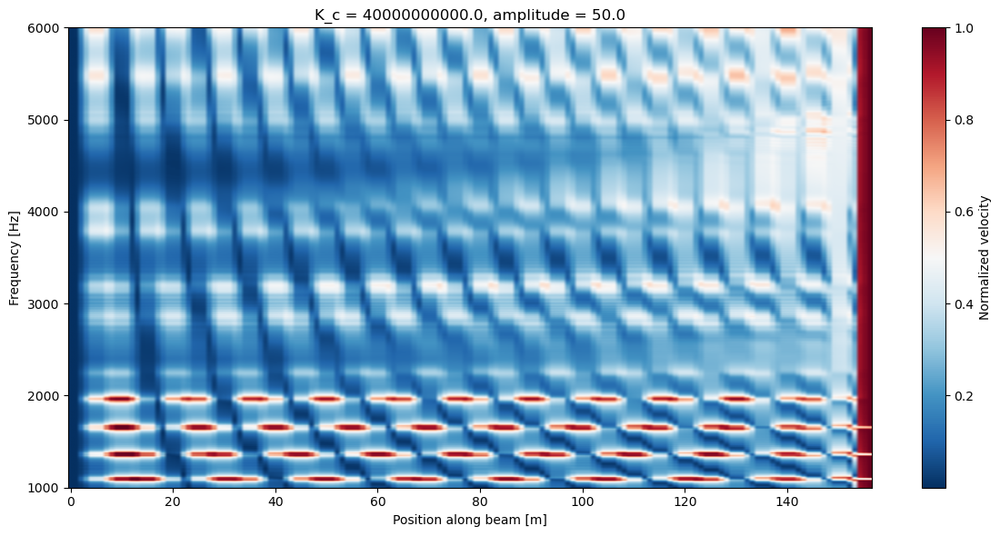

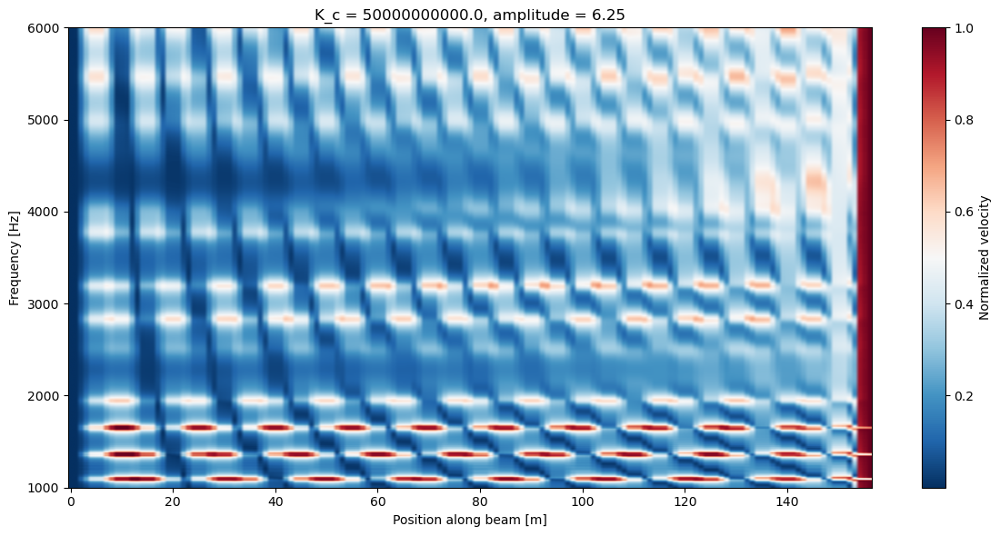

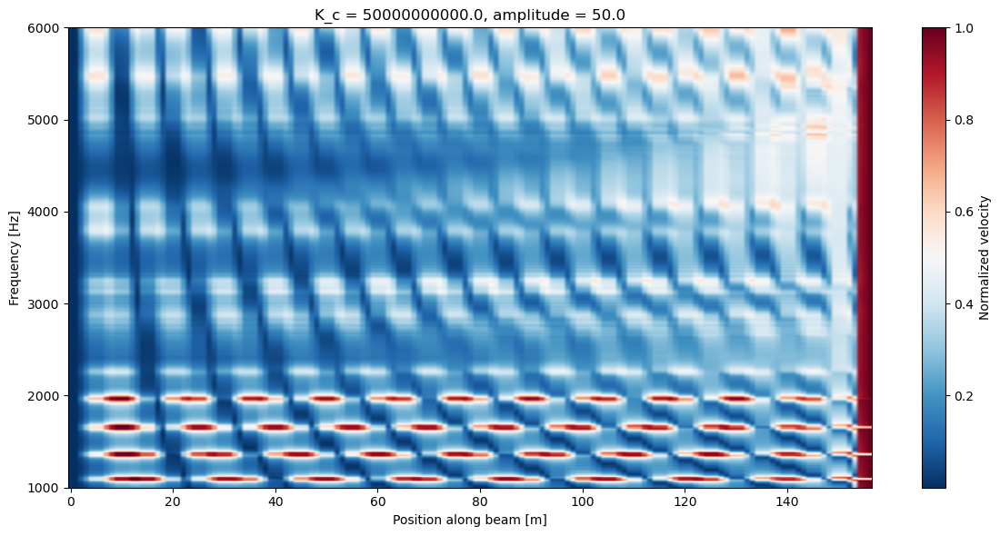

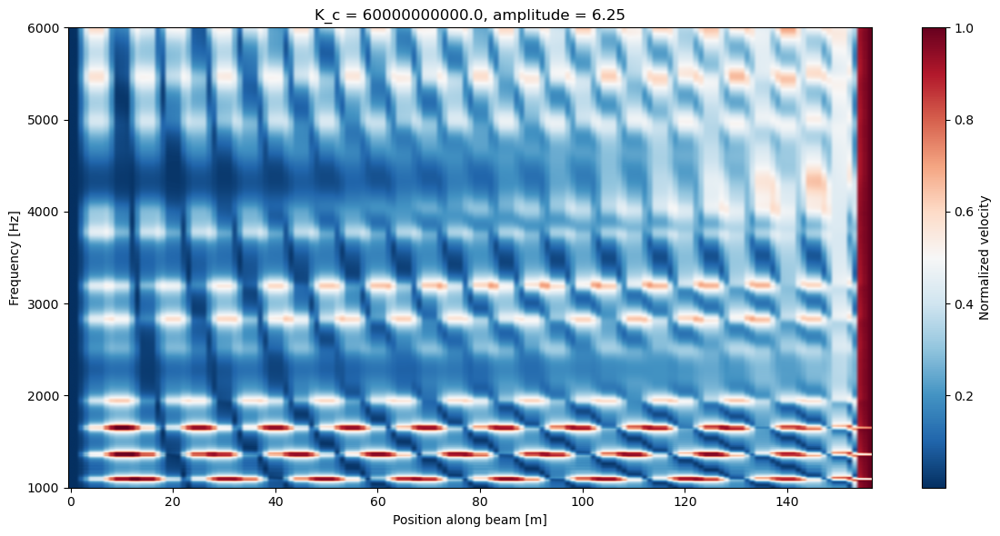

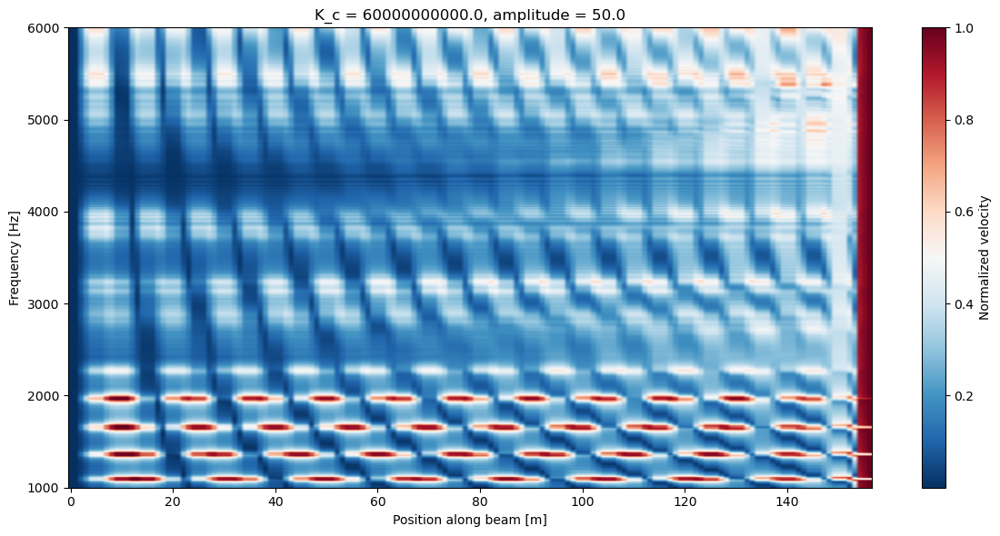

In [ ]:
# Heatmap: normalized velocity for all frequencies
omega_all = 2*np.pi*freq
# v_hat_all = 1j * omega_all[:, np.newaxis] * FRF  # shape: (n_freq, n_nodes)
# group_records = groups[-2e10]

def group_sort_key(item):
    key = item[0]
    try:
        return (0, float(key))
    except (TypeError, ValueError):
        return (1, str(key))

for _, group_records in sorted(groups.items(), key=group_sort_key):
    if len(group_records) == 0:
        continue

    idx = 0
    v_plot_all = np.abs(group_records[idx]["result"]['data']['Y'])#[:, :-10]  # <-- adjust if needed

    # Normalize each frequency by its own maximum
    v_plot_normalized = np.zeros_like(v_plot_all)
    for i in range(v_plot_all.shape[0]):
        max_abs_i = np.max(np.abs(v_plot_all[i, :]))
        if max_abs_i > 0:
            v_plot_normalized[i, :] = v_plot_all[i, :] / max_abs_i

    # Create heatmap
    fig, ax = plt.subplots(figsize=(12, 6))
    im = ax.imshow(v_plot_normalized, aspect='auto', origin='lower', cmap='RdBu_r'
                #    ,extent=[x_coords_fe[0], x_coords_fe[-1], freq[0], freq[-1]]
                )
    ax.set_xlabel('Position along beam [m]')
    ax.set_ylabel('Frequency [Hz]')
    ax.set_ylim([1000, 6000])
    ax.set_title(f'K_c = {group_records[idx]["result"]["params"]["K_c"]}, amplitude = {group_records[idx]["result"]["params"]["amp"]}')
    cbar = plt.colorbar(im, ax=ax, label='Normalized velocity')
    plt.tight_layout()
    plt.show()
    idx = -1
    v_plot_all = np.abs(group_records[idx]["result"]['data']['Y'])#[:, :-10]  # <-- adjust if needed

    # Normalize each frequency by its own maximum
    v_plot_normalized = np.zeros_like(v_plot_all)
    for i in range(v_plot_all.shape[0]):
        max_abs_i = np.max(np.abs(v_plot_all[i, :]))
        if max_abs_i > 0:
            v_plot_normalized[i, :] = v_plot_all[i, :] / max_abs_i

    # Create heatmap
    fig, ax = plt.subplots(figsize=(12, 6))
    im = ax.imshow(v_plot_normalized, aspect='auto', origin='lower', cmap='RdBu_r'
                #    ,extent=[x_coords_fe[0], x_coords_fe[-1], freq[0], freq[-1]]
                )
    ax.set_xlabel('Position along beam [m]')
    ax.set_ylabel('Frequency [Hz]')
    ax.set_ylim([1000, 6000])
    ax.set_title(f'K_c = {group_records[idx]["result"]["params"]["K_c"]}, amplitude = {group_records[idx]["result"]["params"]["amp"]}')
    cbar = plt.colorbar(im, ax=ax, label='Normalized velocity')
    plt.tight_layout()
    plt.show()